# Computer Vision Introductory Demo

## Using Python and Jupyter Notebooks

## Primary Goals
1. Demonstrate use of Python linear programming and Jupyter Notebooks
2. Demonstrate some file I/O with image files
3. Demonstrate Python packages, including numpy, cv2, and image/plotting tools
4. Demonstrate basic initial computer vision tasks:
    - Camera Calibration
    - Distortion/Undistortion
    - Color filters and Color spaces
    - Bitwise AND/OR/XOR functions applied to image pixels
    - Perspective Transforms
    - Edge Detection
    - Hough Lines/Circles
    - Where to go next

In [1]:
# Import all necessary packages

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import deque
%matplotlib inline

# Camera Calibration

A camera must be calibrated to correct for lens distortion (a.k.a. fisheye and pincushion effects), but only needs to be calibrated once per camera (assuming no adjustments made). This is because once you have the camera details, you can apply the same calibration functions to that camera's pictures indefinitely.

Calibrations are often done with a chess/checkerboard, because of the straight lines, right angles, equal side lengths (i.e. squares), and high contrast between squares.

### Camera Calibration Functions

In [2]:
def calibrate_camera(chessboard_width,
                    chessboard_height, 
                    calibration_images_path):
    """
    Key cv2 functions:
        imread: reads in an image
        cvtColor: converts to specific color-type (in this case from RGB to grayscale)
    """
    
    # Create object points that will match the inner corners of a chessboard
    objp = np.zeros((chessboard_height*chessboard_width,3), np.float32) 
    objp[:,:2] = np.mgrid[0:chessboard_width, 0:chessboard_height].T.reshape(-1,2) 
    
    # create object point and image points to correlate between objects in the real world and objects in the image
    object_points=[]
    image_points=[]                 
                     
    # get the images
    images = glob.glob(calibration_images_path)
    
    # go through the images and add object/image points to the
    for idx, fname in enumerate(images):
        # read in the images and convert to grayscale
        img = cv2.imread(fname)
        object_points, image_points = calibrate_camera_single_image(img, 
                                                                    chessboard_width,
                                                                    chessboard_height, 
                                                                    object_points,
                                                                    image_points,
                                                                    objp)
            
    # return the found object and image point correlations (to be used in undistorting images)
    return object_points, image_points
   
    
    
def calibrate_camera_single_image(img, chessboard_width, chessboard_height, object_points, image_points, objp):
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (chessboard_width, chessboard_height), None)

    # If found, add object points, image points, and plot
    if ret == True:
        # for each set of corners found in an image, add another set of object points
        # and a set of corresponding image points
        object_points.append(objp)
        image_points.append(corners)

        # Draw and display the corners
        plot_chess_corners(img, chessboard_width, chessboard_height, corners, ret)
            
    # return the found object and image point correlations (to be used in undistorting images)
    return object_points, image_points
    
    
    
def plot_chess_corners(img, chessboard_width, chessboard_height, corners, ret):
    """
    Key cv2 function
        findChessBoadCorners: corner detection algorithm, often used for calibrating cameras
    """
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,15))
    
    # show original image
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=12)
    
    # show image with corners IDed
    cv2.drawChessboardCorners(img, (chessboard_width,chessboard_height), corners, ret)
    ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax2.set_title('With Corners', fontsize=12) 
    
    
    

### Camera Calibration

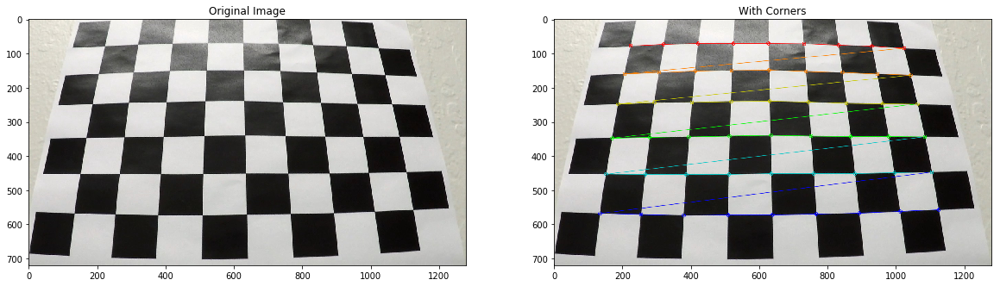

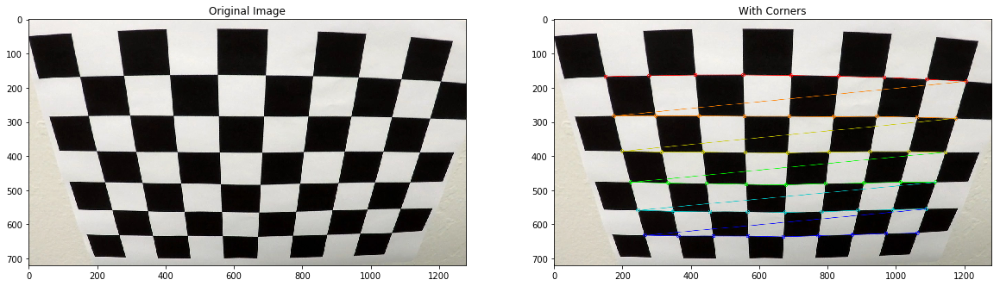

In [3]:
chessboard_width = 9
chessboard_height = 6
calibration_images_path = 'images_camera_calibration/calibration*.jpg'

objpoints, imgpoints = calibrate_camera(chessboard_width, 
                 chessboard_height, 
                 calibration_images_path)

# Undistort Images using Camera's Calibration Matrix

The matrix used to in calibration can only be applied to the same camera. So with the same camera, take regular photos and undistort them use the calibration matrix.

Next create undistort() function which uses the calculate camera calibration matrix and distortion coefficients to remove distortion from an image and output the undistorted image.

In [4]:
# Remove distortion from images
def undistort(img, show=True, read = True):
    if read:
        img = cv2.imread(img)
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    if show:
        show_undistorted_image(img, undist)
    else:
        return undist
    
def show_undistorted_image(original_image, undistorted_image):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,15))

    # Show original Image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=12)
    
    # Show image after undistortion
    ax2.imshow(cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=12)

### Undistort images

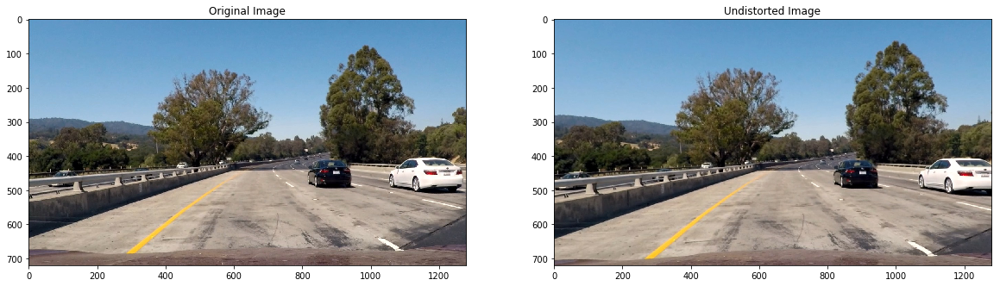

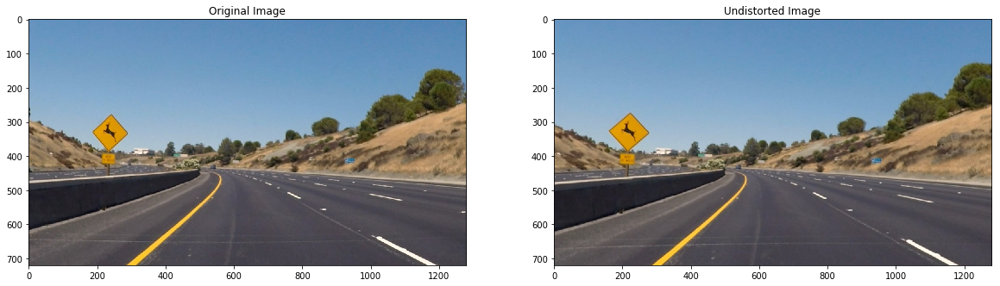

In [5]:
images = glob.glob('images_undistort/test*.jpg')
for image in images:
    undistort(image)

### What happens when you try to undistort an highly distorted image?

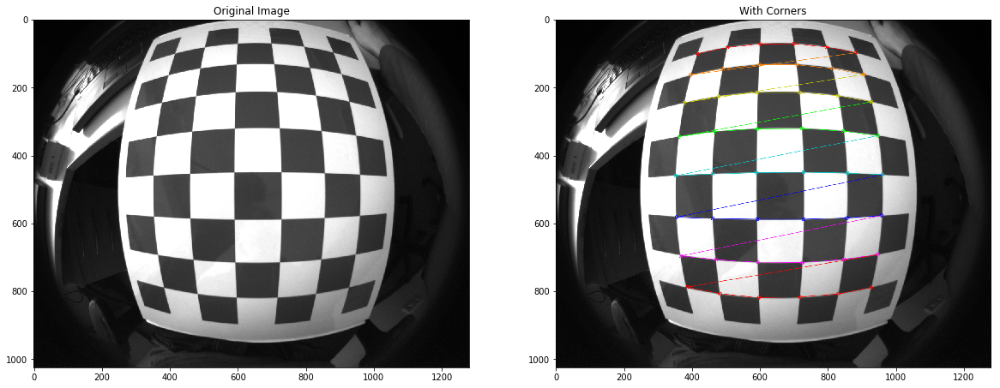

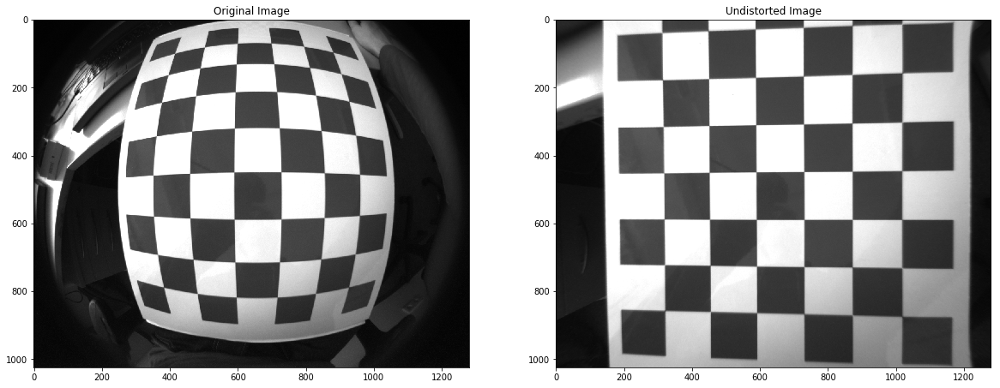

In [6]:
# Recalibrating (different camera with high fish-eye effect, and different chessboard layout)
chessboard_width = 6
chessboard_height = 8
calibration_images_path = 'fisheye-chessboard.jpg'
object_points=[]
image_points=[] 

objpoints, imgpoints = calibrate_camera(chessboard_width, 
                 chessboard_height, 
                 calibration_images_path)


# Actually undistorting
undistort(calibration_images_path)

### What happens if we "undistort" an already corrected image?

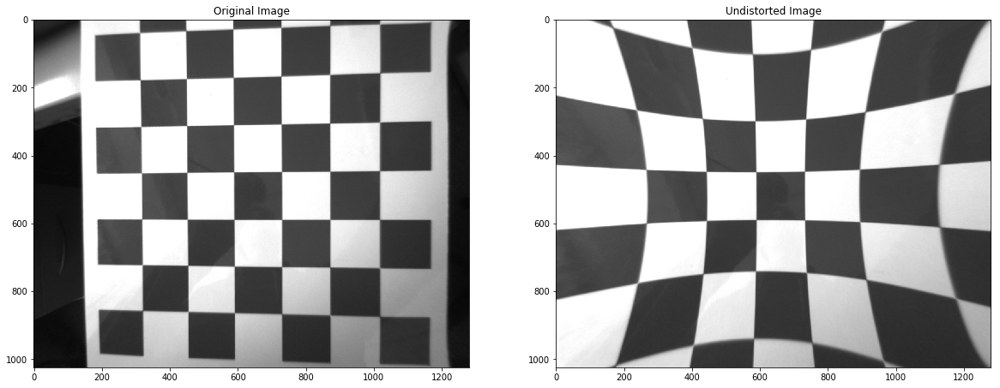

In [7]:
# "Undistorting" an already undistorted image
# save the undistorted (corrected) image, then re-"undistort" it
image = undistort(calibration_images_path, show=False)
undistort(image, read=False)

### What happens if we do it a few more times? 5? 20?

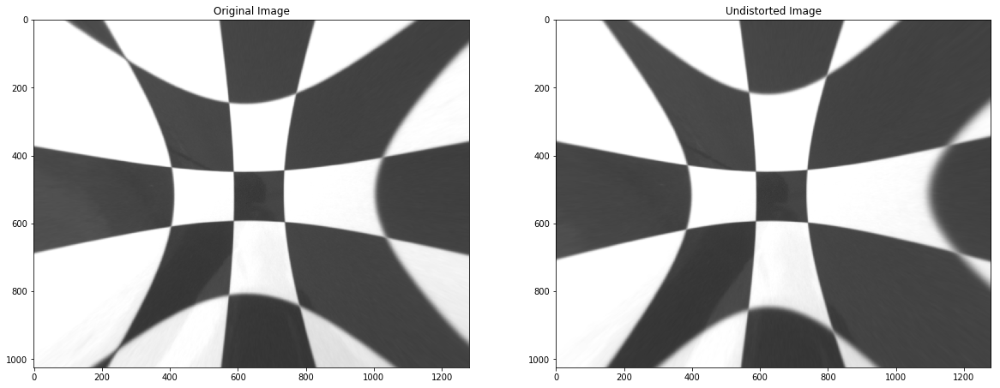

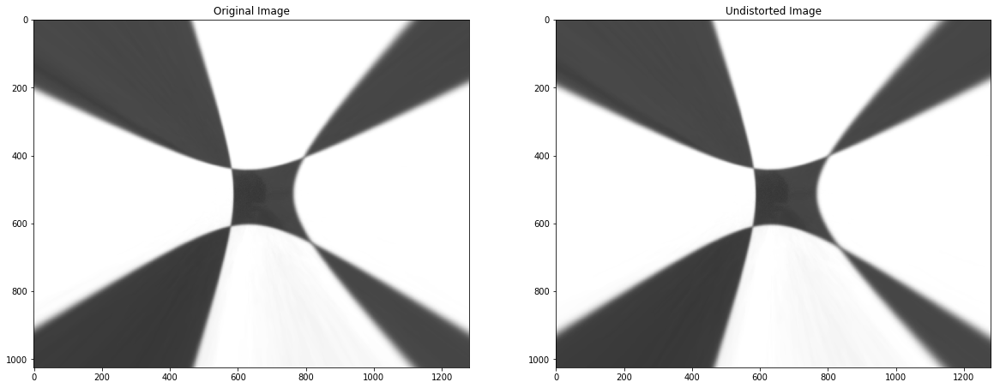

In [8]:
# What happens if we do it a few more times?
image = undistort(calibration_images_path, show=False)
for i in range(4):
    image = undistort(image, read=False, show=False)

undistort(image, read=False)

# And a few more after that
image = undistort(calibration_images_path, show=False)
for i in range(19):
    image = undistort(image, read=False, show=False)

undistort(image, read=False)

# Moving on...

# Color Filters and Color Space!

## Color Spaces
There are many color spaces. A color spaces is just the definition of coloration based on parameters.

### Grayscale
The most intuitive color space is grayscale. This is a single channel (only one value to represent a color) that shows intensity of light, where 0 (or 0%) is black, 1 (or 100%) is white, and 0.5 (or 50%) is the most medium gray we can represent.

### Colormaps
Also called heatmaps, these show intensity of a desired trait of an image into a colorful format. Often used with non-visible light spectrum conversion (IR, UV, Gamma, X-Ray conversion to what humans can see). Also can be used on regular images to identify intensity of the specified parameter, whether it be lighting or hue.

Text(0.5, 1.0, 'Grayscaled Image')

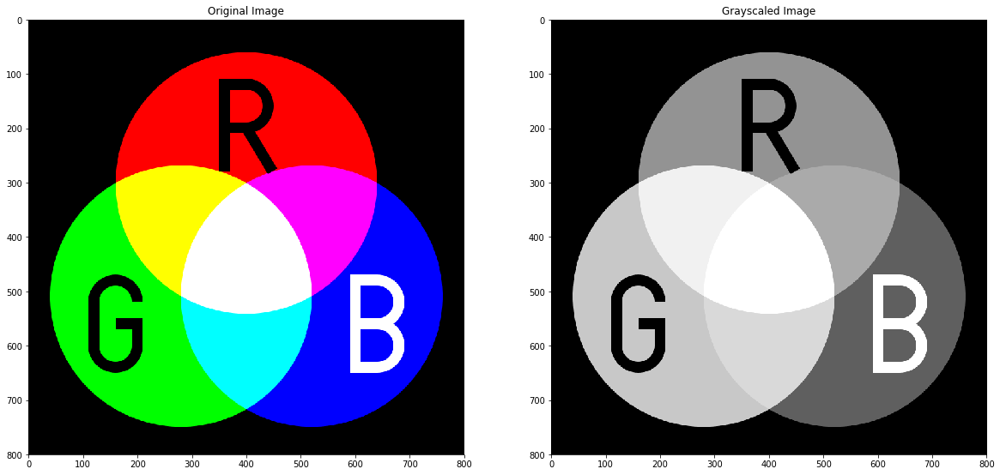

In [9]:
path = 'images_color_space/rbg_image.png'
img = cv2.imread(path)
gray = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
cv2.imwrite('images_color_space/gray_image.png',gray)
gray = cv2.imread('images_color_space/gray_image.png')

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,15))

# Show original Image
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=12)

# Show image after grayscaling
ax2.imshow(gray)
ax2.set_title('Grayscaled Image', fontsize=12)

### RBG
For example, RGB (also sometimes called BGR or RBG) is a common 3-channel color-space which indicates the amount of red, blue, and green that exists in a pixel, where 0 means no color of that type and 255 means maximum color of that type.

RGB(0,0,0) = Black, RGB(255, 255, 255) = White, RGB(255, 0, 0) = Red, etc.


### HSL and HSV
However, that doesn't really account enough for variables like lighting or saturation. That's where the HSL and HSV color spaces come into play. 

HSL = Hue, Saturation, Lighting

HSV = Hue, Saturation, Value

- Hue: 0-360 (0 & 360 = Red, 120 = Green, 240 = Blue)
    - sometimes 0-180, red is 0 & 180, green is 60, blue is 120
- Saturation: Grayness (0 = monochromatic black to white, 1 = colorful)
- Lightness: Brightness of the color (0 = dark, 1 = light)
- Value: Half of brightness (0 = dark, 1 = 0.5 on the HSL L-channel)

Text(0.5, 1.0, 'HSL Cylinder')

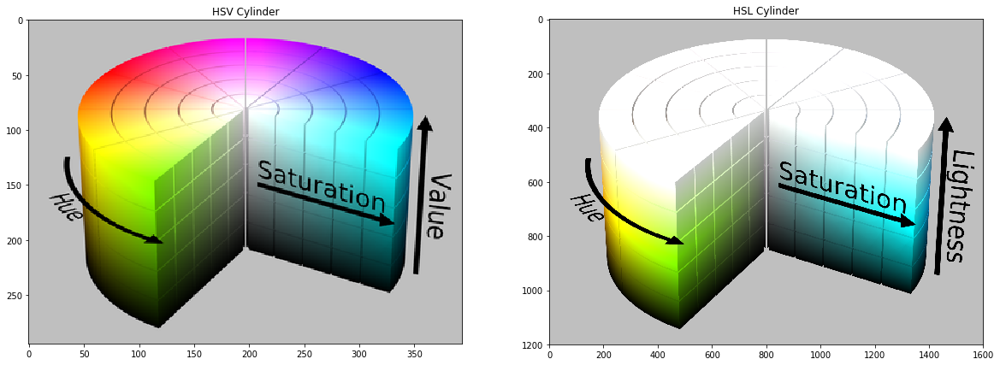

In [10]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,15))

# Show original Image
img = cv2.imread('images_color_space/HSV Cylinder.jpg')
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('HSV Cylinder', fontsize=12)

# Show image after grayscaling
img = cv2.imread('images_color_space/HSL.jpg')
ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax2.set_title('HSL Cylinder', fontsize=12)

## Color filters!

Let's select a few images and filter out some things.

In [11]:
def compare_two_images(original_image, altered_image, gray=False):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,15))

    # Show original Image
    ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=12)
    
    # Show image after undistortion
    if gray==True:
        ax2.imshow(cv2.cvtColor(altered_image, cv2.COLOR_GRAY2RGB))
        ax2.set_title('Altered Image', fontsize=12)
    else:
        ax2.imshow(cv2.cvtColor(altered_image, cv2.COLOR_BGR2RGB))
        ax2.set_title('Altered Image', fontsize=12)
    
    
    
def convert_hls(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

def convert_hsv(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HSV)


def select_red(image):
    converted = convert_hsv(image)
    lower = np.array([100,120,70])
    upper = np.array([140,255,255])
    mask = cv2.inRange(converted, lower, upper)
    return mask
    
    
def select_green(image):
    converted = convert_hsv(image)
    lower = np.array([40,120,70])
    upper = np.array([80,255,255])
    mask = cv2.inRange(converted, lower, upper)
    return mask
    
    
def select_blue(image, show=False):
    converted = convert_hsv(image)
    if show==True:
        compare_two_images(cv2.cvtColor(image, cv2.COLOR_HSV2RGB), cv2.cvtColor(converted, cv2.COLOR_HSV2RGB))

    # lower mask (0-10)
    lower = np.array([0,120,70])
    upper = np.array([20,255,255])
    mask0 = cv2.inRange(converted, lower, upper)

    # upper mask (170-180)
    lower = np.array([160,120,70])
    upper = np.array([180,255,255])
    mask1 = cv2.inRange(converted, lower, upper)
    
    mask = mask0 + mask1 # have to combine them because red is both slightly above and below 0/180 respectively
    return mask
    
    
def select_light(image):
    converted = convert_hls(image)
    lower = np.array([0, 180, 0])
    upper = np.array([255, 255, 255])
    mask = cv2.inRange(converted, lower, upper)
    return mask
    
    
def select_dark(image):
    converted = convert_hls(image)
    lower = np.array([0, 0, 0])
    upper = np.array([255, 75, 255])
    mask = cv2.inRange(converted, lower, upper)
    return mask


def select_half_dark(image):
    converted = convert_hls(image)
    lower = np.array([0, 0, 0])
    upper = np.array([255, 127, 255])
    mask = cv2.inRange(converted, lower, upper)
    return mask

### How to tell differences between images?
### Similarities?
### How to invert an image?

Bitwise functions! Used when a picture's pixels are defined only as 0 or 1. If they meet a certain threshold.
- XOR: identifies only the pixels that are different
- AND: identifies only the pixels that are exactly the same
- OR: identifies the pixels that meet a threshold in two pictures
- NOT: inverts the value of the pixels

Examples of thresholds:
- Is your object of interest light/dark enough?
    - very useful with non-visible mapping
- Is your object blue/green/red enough?
    - what if you want to differentiate traffic lights
- Do you just want to track differences between images taken seconds apart?
    - bitwise XOR!


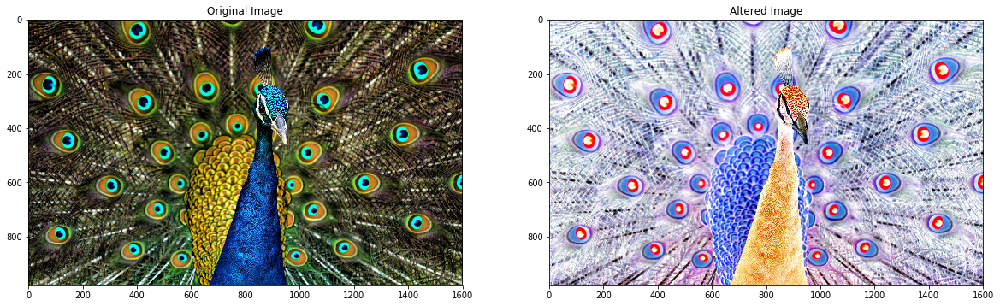

In [12]:
img = cv2.imread('images_color_filters/Peacock_Plumage.jpg')

# reverse the bits:
negated = cv2.bitwise_not(img)
compare_two_images(img, negated)

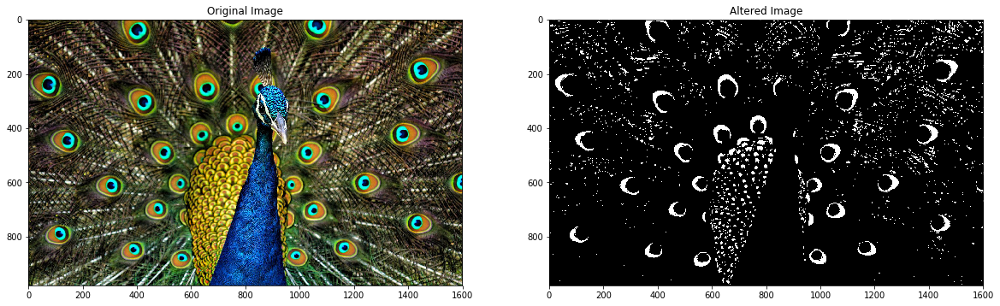

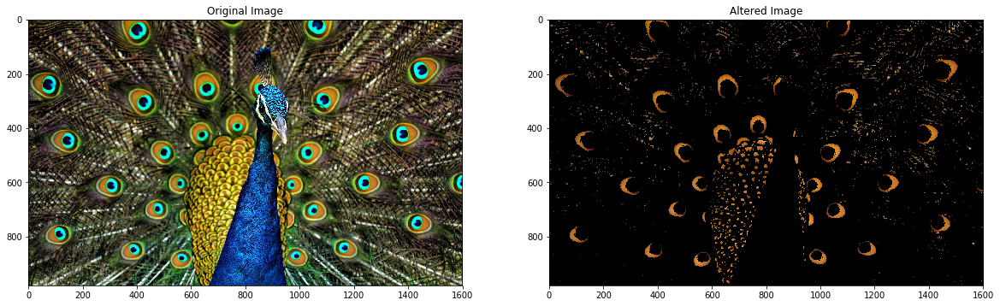

In [13]:
# filter: keep in only red
red_mask = select_red(img) #shows image in HSV space
compare_two_images(img, red_mask, gray=True) # shows the mask

filtered_red = cv2.bitwise_and(img, img, mask=red_mask)
compare_two_images(img, filtered_red) # shows the filtered image

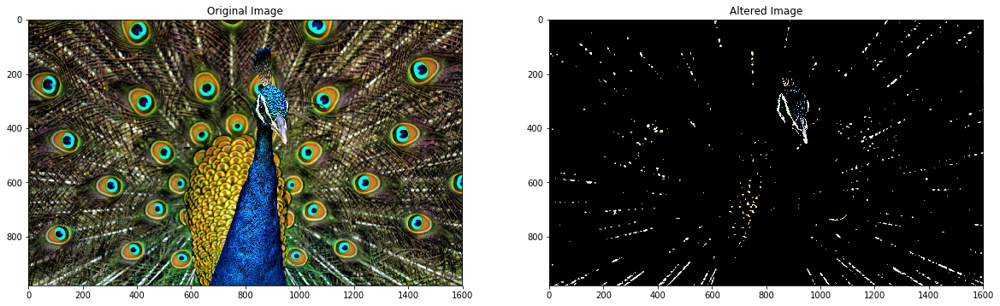

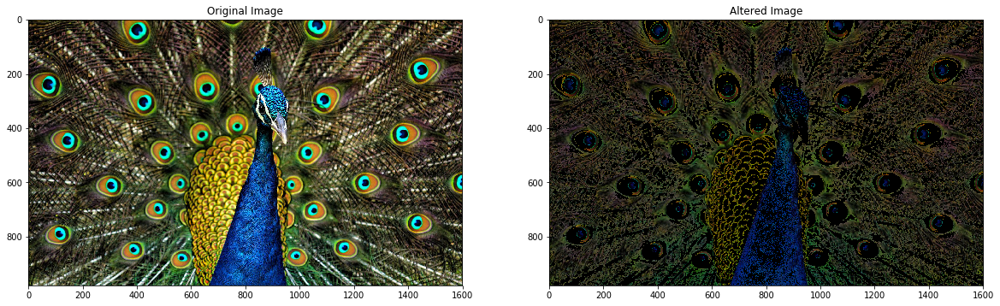

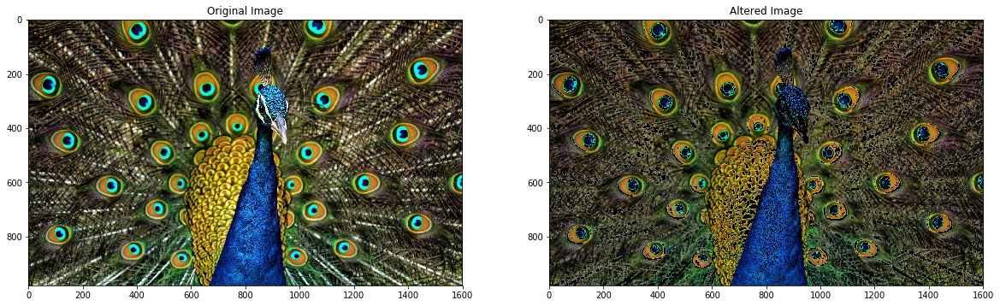

In [14]:
# filter: keep in only light
mask = select_light(img) #shows image in HSV space

filtered = cv2.bitwise_and(img, img, mask=mask)
compare_two_images(img, filtered) # shows the filtered image

# filter: keep in only dark
mask = select_dark(img) #shows image in HSV space

filtered = cv2.bitwise_and(img, img, mask=mask)
compare_two_images(img, filtered) # shows the filtered image

# filter: keep in only half-dark
mask = select_half_dark(img) #shows image in HSV space

filtered = cv2.bitwise_and(img, img, mask=mask)
compare_two_images(img, filtered) # shows the filtered image

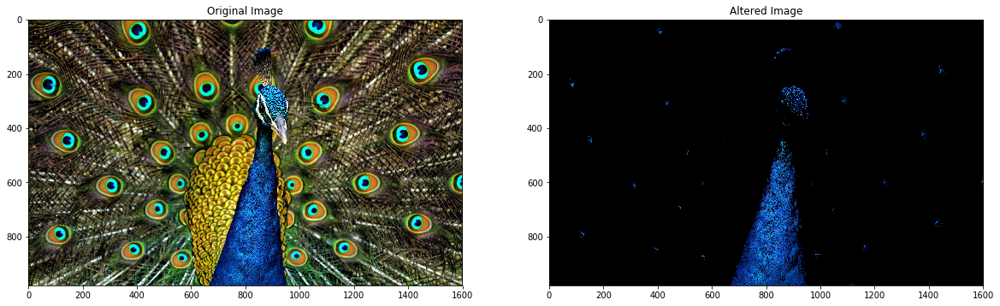

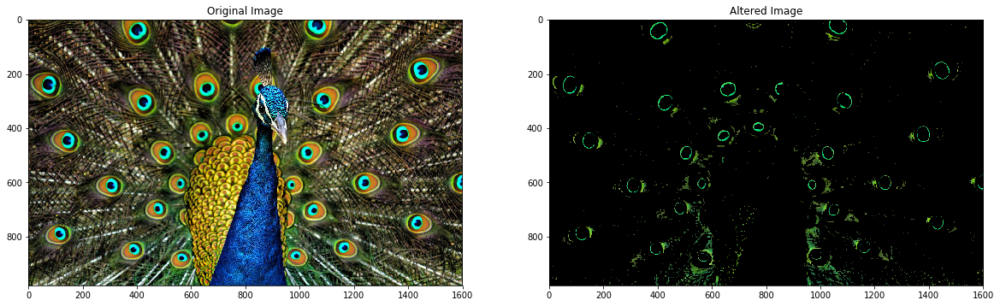

In [15]:
# filter: keep in only blue
mask = select_blue(img)

filtered = cv2.bitwise_and(img, img, mask=mask)
compare_two_images(img, filtered) # shows the filtered image

# filter: keep in only green
mask = select_green(img) 

filtered = cv2.bitwise_and(img, img, mask=mask)
compare_two_images(img, filtered) # shows the filtered image

### That doesn't give us much...
### What if we try a bunch of things!?

In [16]:
def select_extremes_dark_or_light(image):
    mask1 = select_dark(image)
    mask2 = select_light(image)
    mask = cv2.bitwise_or(mask1, mask2)
    return mask
    
    
def select_red_and_light(image):
    mask1 = select_red(image)
    mask2 = select_light(image)
    mask = cv2.bitwise_and(mask1, mask2)
    return mask
    
    
def select_neither_red_nor_light(image):
    mask1 = select_red(image)
    mask2 = select_light(image)
    mask = cv2.bitwise_or(mask1, mask2) # red or light
    mask = cv2.bitwise_not(mask) # neither red nor light
    return mask


def select_red_or_light_but_not_both(image):
    mask1 = select_red(image)
    mask2 = select_light(image)
    mask = cv2.bitwise_xor(mask1, mask2)
    return mask

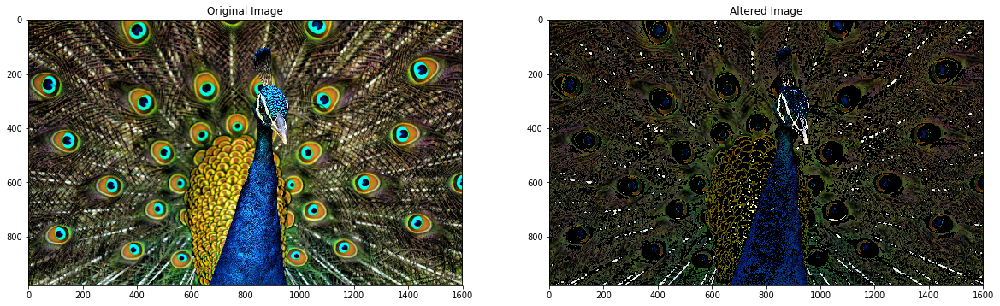

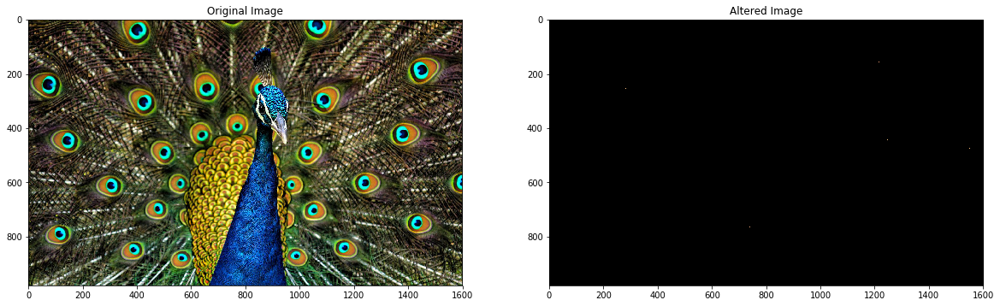

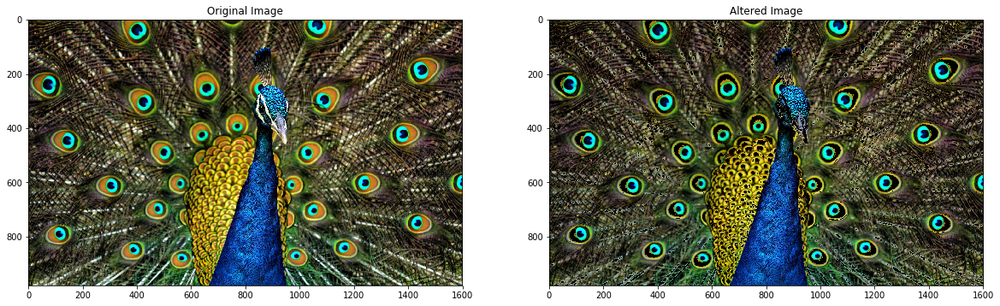

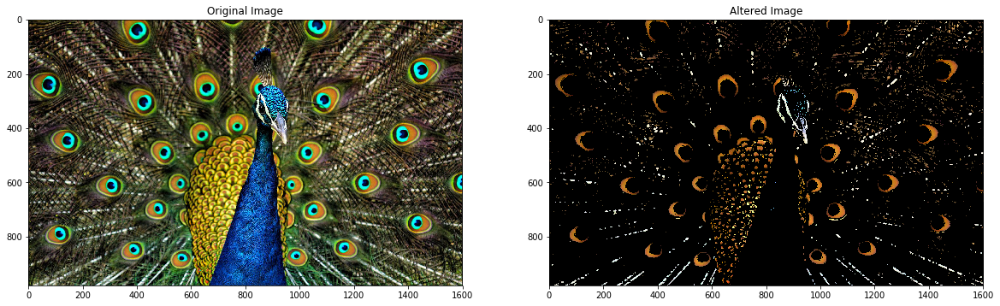

In [17]:
# filter: keep in dark or bright
mask = select_extremes_dark_or_light(img)

filtered = cv2.bitwise_and(img, img, mask=mask)
compare_two_images(img, filtered) # shows the filtered image


# filter: keep in red and light
mask = select_red_and_light(img)

filtered = cv2.bitwise_and(img, img, mask=mask)
compare_two_images(img, filtered) # shows the filtered image


# filter: keep in neither red nor light
mask = select_neither_red_nor_light(img) 

filtered = cv2.bitwise_and(img, img, mask=mask)
compare_two_images(img, filtered) # shows the filtered image


# filter: keep in only red or light but not both
mask = select_red_or_light_but_not_both(img)

filtered = cv2.bitwise_and(img, img, mask=mask)
compare_two_images(img, filtered) # shows the filtered image



## ^^^ It may just be my colorblind eyes but I did not see the red in the peacock plumage ever before doing this...

# Find the difference (there are apparently 8)

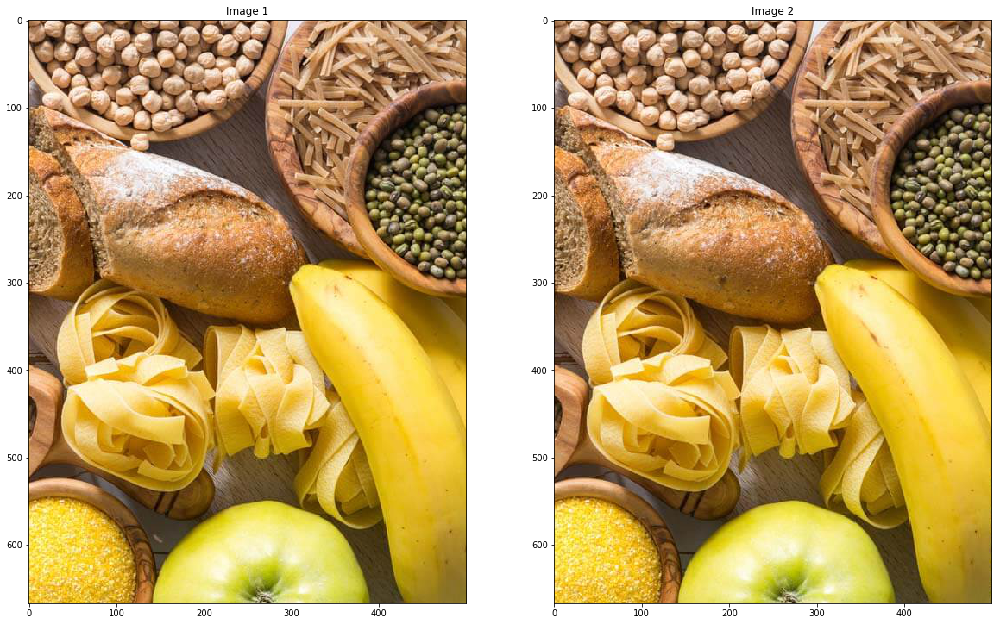

In [18]:
def show_difference_pictures_2(image1, image2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,15))

    # Show both images
    ax1.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
    ax1.set_title('Image 1', fontsize=12)
    
    ax2.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
    ax2.set_title('Image 2', fontsize=12)
    
def show_difference_pictures_3(image1, image2, image3):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,15))

    # Show both images
    ax1.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
    ax1.set_title('Image 1', fontsize=12)
    
    ax2.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
    ax2.set_title('Image 2', fontsize=12)

    ax3.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
    ax3.set_title('Differences', fontsize=12)



    
def crop_left_half(image):
    height, width, channels = image.shape
    cropped_img = image[0:height,width//2:width]
    return cropped_img
    
def crop_right_half(image):
    height, width, channels = image.shape
    cropped_img = image[0:height,0:width//2]
    return cropped_img
    
img = cv2.imread('images_color_filters/02_can-you-spot-the-difference-in-these-10-pictures-429328036-oleksandra-naumenko.jpg')

show_difference_pictures_2(crop_left_half(img), crop_right_half(img))

## Let's just bitwise XOR them?

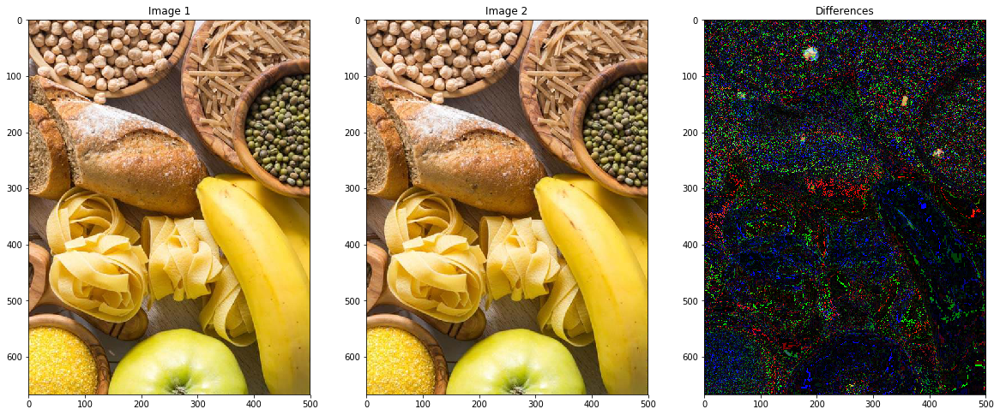

In [19]:
img_xor = cv2.bitwise_xor(crop_left_half(img), crop_right_half(img))
show_difference_pictures_3(crop_left_half(img), crop_right_half(img), img_xor)

## Hard for me to see, so let's negate it
Might reduce the contrast?

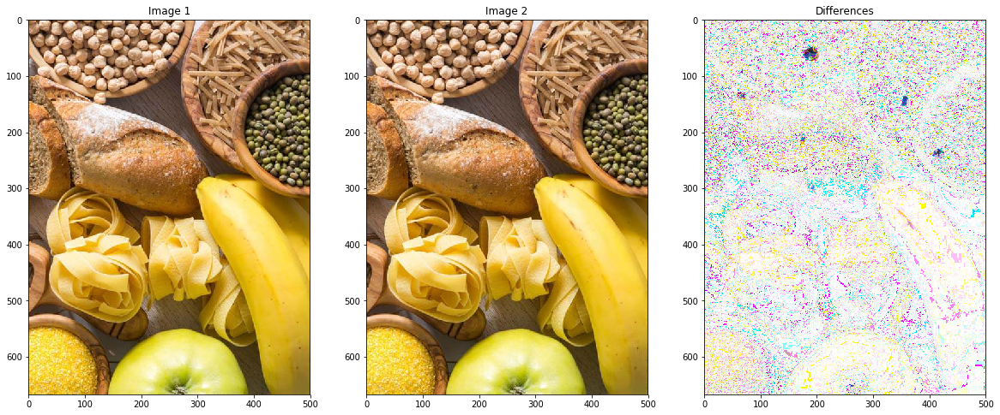

In [20]:
img_xor = cv2.bitwise_not(cv2.bitwise_xor(crop_left_half(img), crop_right_half(img)))
show_difference_pictures_3(crop_left_half(img), crop_right_half(img), img_xor)

# And now for something else!
# Edge Detection
Edge detection is the concept that we can figure out the contrast in a small group of pixels in order to view where edges may exist.

Can be applied in multiple directions (vertical, horizontal, diagonal). There is also corner detection (remember calibrating the camera? we used the chess corners as references)!

Should be done on a color-filtered image first

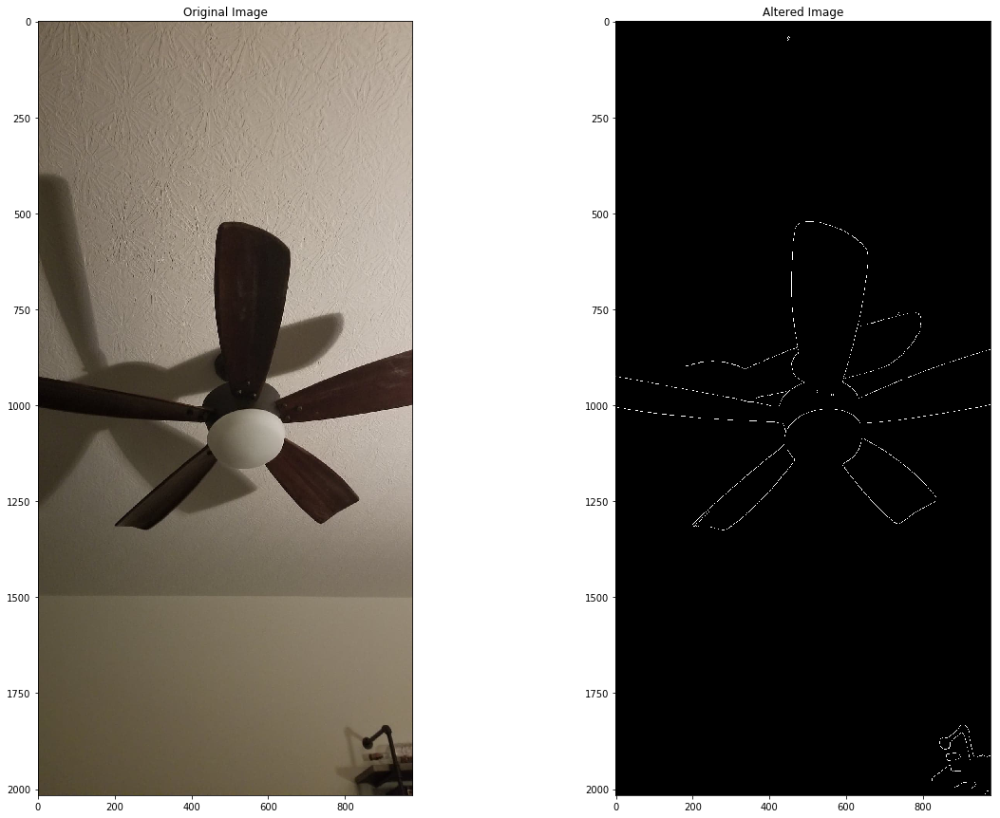

In [40]:
def canny(img, low_threshold, high_threshold):
    #Applies the Canny transform
    return cv2.Canny(img, low_threshold, high_threshold)


def gaussian_blur(img, kernel_size=9):
    #Applies a Gaussian Noise kernel
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)


img = cv2.imread('images_edge_detection/ceiling fan.jpg')

imshape = img.shape

# Filter white and yellow color
#filter_img = select_white_yellow(img)

# Smooth edges with gaussian blur
blur_img = gaussian_blur(img, kernel_size=9)

# Canny edges detection
edges = canny(blur_img, low_threshold=40, high_threshold=100)

compare_two_images(img, edges, gray=True)

# Cool, so what do I do with this?

Well, maybe we try to find exact lines and figure out shapes?

## Hough Lines
Using edges, we can translate pixels into "points" as though on graphing paper, and make correlations based on how "strong" the lines are. How long are they? How many blank pixels are there between full pixels?

[[[ 301  234  301  233]]

 [[ 473  211  473  206]]

 [[ 716  732  719  733]]

 ...

 [[ 720  565  721  566]]

 [[ 886 1123  887 1124]]

 [[ 937 1986  937 1987]]]


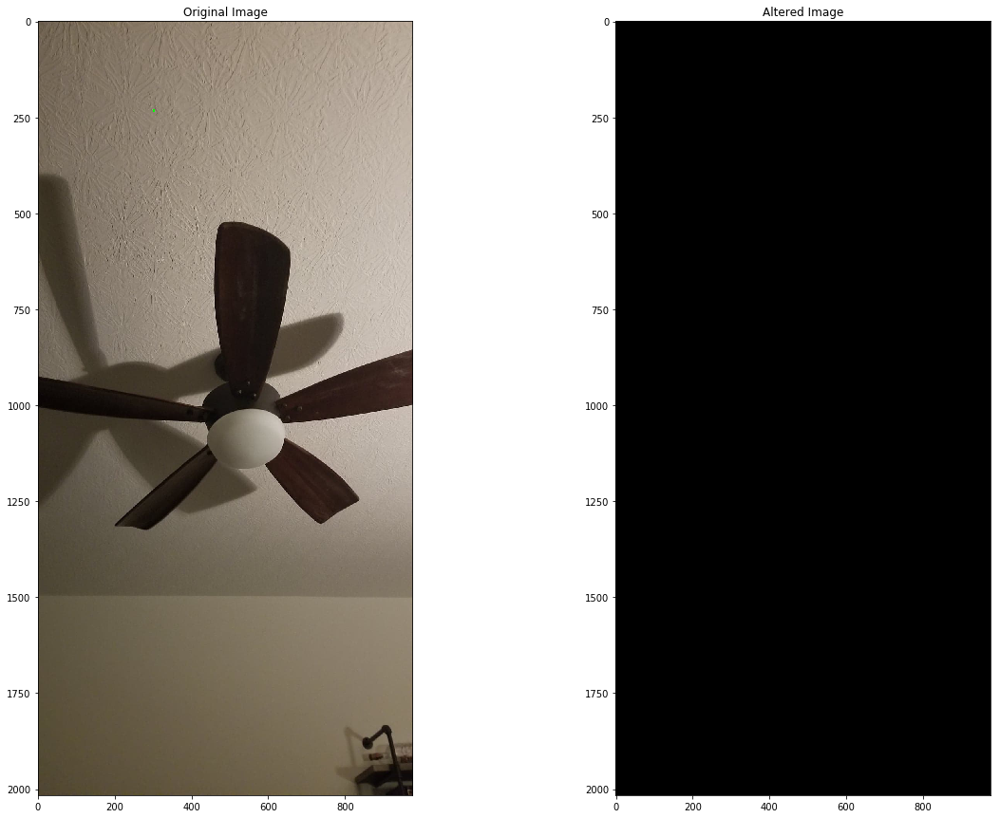

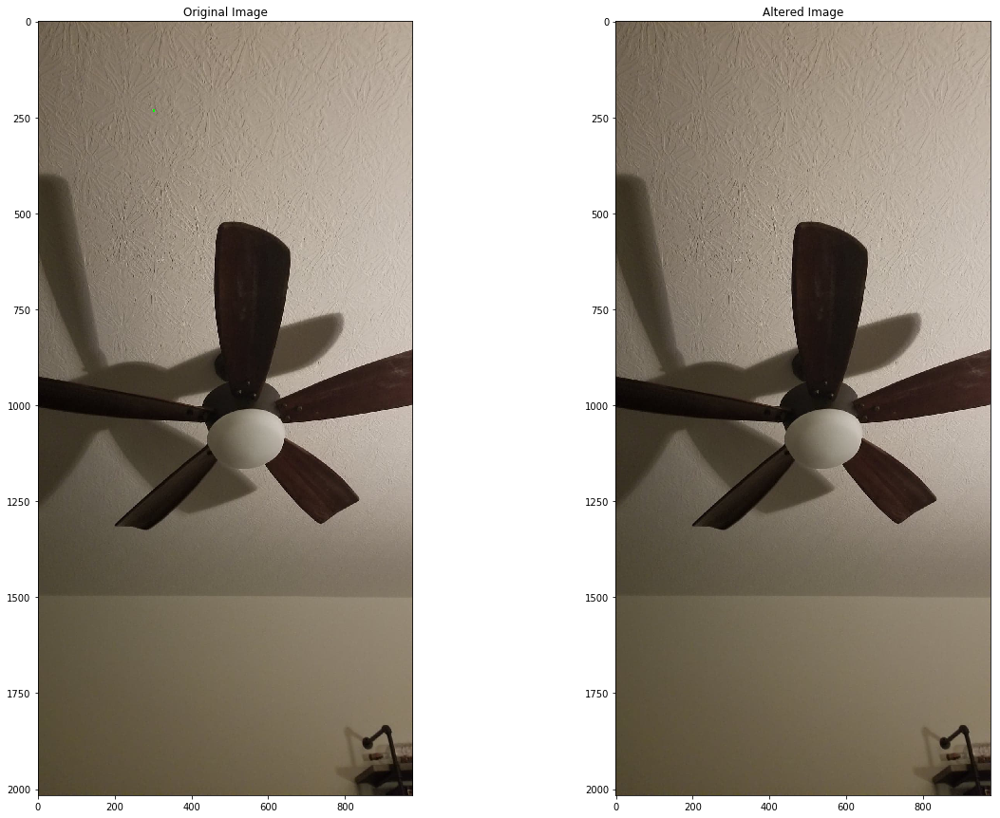

In [51]:
def hough_lines(img, rho, theta, threshold, min_line_length, max_line_gap):
    # Draws hough lines on an image

    linesP = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_length, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    cdstP = np.copy(img)
    
    if linesP is not None:
        for i in range(0, len(linesP)):
            l = linesP[i][0]
            cv2.line(cdstP, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
    #draw_lines(line_img, lines, thickness=15)

    return line_img


def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    imshape = img.shape

    # Divide the points between left and right lane
    left_lines = lines[lines[:, :, 0] < imshape[1]/2]
    right_lines = lines[lines[:, :, 0] > imshape[1]/2]

    # Use a linear regression to get the slope and intersect of left lane
    left_regr = linear_model.LinearRegression()
    left_regr.fit(np.reshape(left_lines[:, [0, 2]], (-1, 1)), np.reshape(left_lines[:, [1, 3]], (-1, 1)))

    # Use a linear regression to get the slope and intersect of right lane
    right_regr = linear_model.LinearRegression()
    right_regr.fit(np.reshape(right_lines[:, [0, 2]], (-1, 1)), np.reshape(right_lines[:, [1, 3]], (-1, 1)))

    # Check if there are right_lines and draw the lane on the image
    if len(right_lines) > 0:
        draw_line(img, color, thickness,  imshape[0], int(imshape[0]*5/8), right_regr.coef_, right_regr.intercept_)

    # Check if there are left_lines and draw the lane on the image
    if len(left_lines) > 0:
        draw_line(img, color, thickness, imshape[0], int(imshape[0]*5/8), left_regr.coef_, left_regr.intercept_)

        
def draw_line(img, color, thickness, y1, y2, slope, intercept):
    # Calculates and draws line based on slope and intercept
    x1 = int((y1 - intercept)/slope)
    x2 = int((y2 - intercept)/slope)
    cv2.line(img, (x1, y1), (x2, y2), color, thickness)
    

line_img = hough_lines(edges, rho=1, theta=np.pi/180, threshold=1, min_line_length=2, max_line_gap=2)

# Draw lane lines on image with transparency
copy_image = np.copy(img)
lines_edges = cv2.addWeighted(copy_image, 0.8, line_img, 1, 0)

compare_two_images(copy_image, line_img, gray=False)




##########
img = cv2.imread('images_edge_detection/ceiling fan.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray,50,150)

minLineLength = 1
maxLineGap = 1
lines = cv2.HoughLinesP(edges,1,np.pi/180,10,minLineLength,maxLineGap)
for x1,y1,x2,y2 in lines[0]:
    cv2.line(edges,(x1,y1),(x2,y2),(0,255,0),5)

cv2.imwrite('houghlines5.jpg',img)

compare_two_images(copy_image, cv2.imread('houghlines5.jpg'), gray=False)
